##**미술 작품 색상과 질감 비교 분석 알고리즘**

색상 분석

In [2]:
from google.colab.patches import cv2_imshow
from google.colab import drive
import numpy as np
import cv2
import matplotlib.pyplot as plt
drive.mount('/content/gdrive')

Mounted at /content/gdrive


별이 빛나는 밤: (791, 1000, 3)


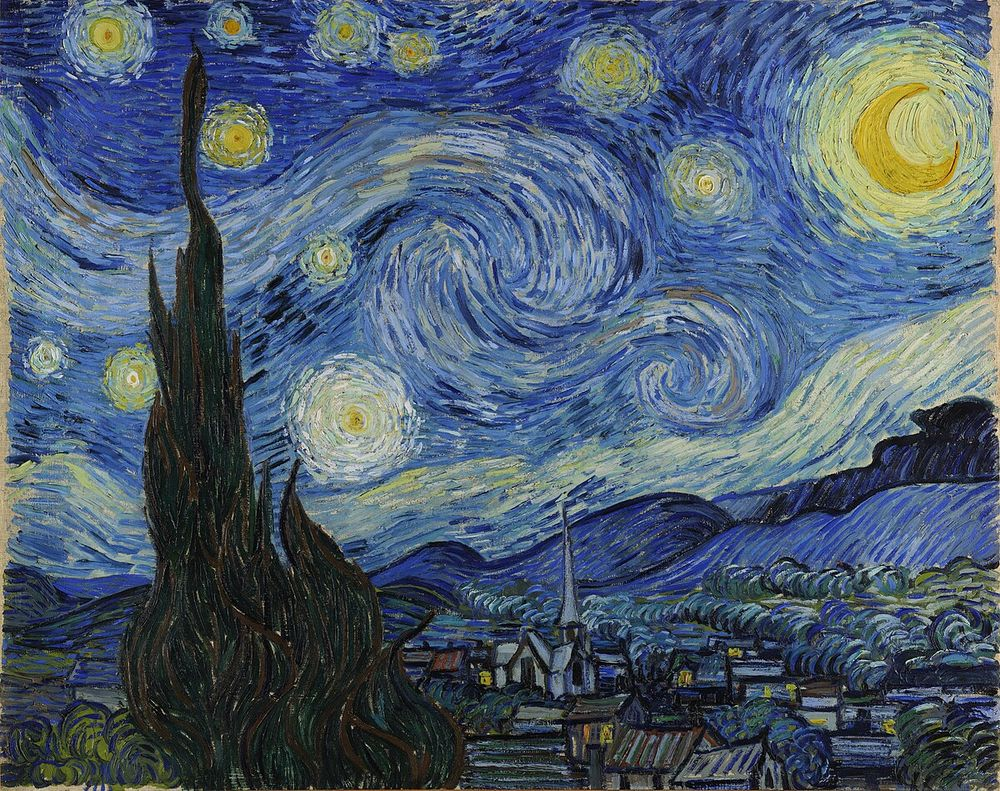

인상, 해돋이: (388, 500, 3)


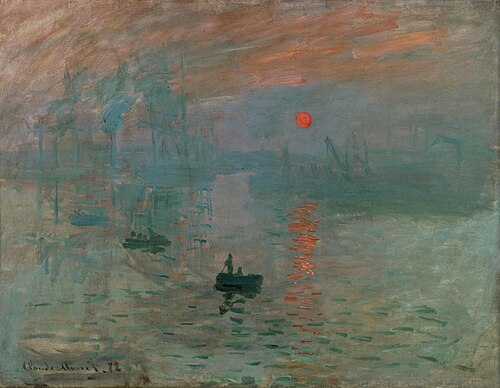

In [3]:
# 분석 대상: 반 고흐 - 별이 빛나는 밤, 모네 - 인상, 해돋이
img_sn = cv2.imread('/content/gdrive/My Drive/IP/Images/starry_night.jpg')
print("별이 빛나는 밤:", img_sn.shape)
cv2_imshow(img_sn)

img_sr = cv2.imread('/content/gdrive/My Drive/IP/Images/sunrise.jpg')
print("인상, 해돋이:", img_sr.shape)
cv2_imshow(img_sr)

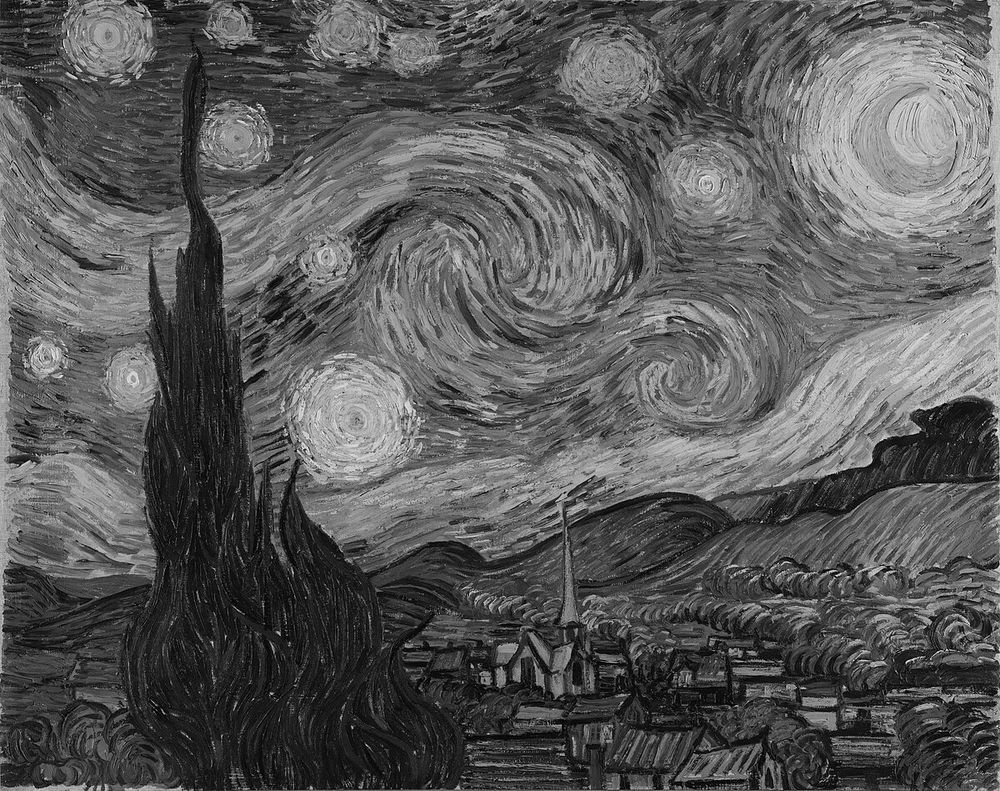

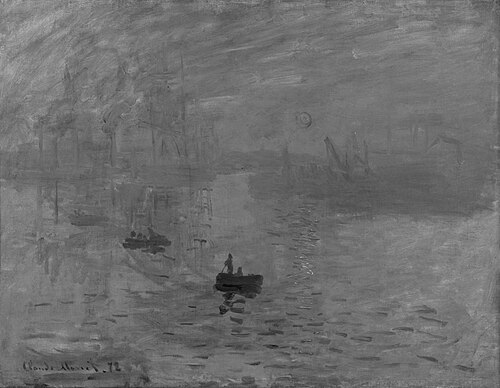

In [ ]:
# 그레이 변환
g_sn = cv2.cvtColor(img_sn, cv2.COLOR_BGR2GRAY)
cv2_imshow(g_sn)

g_sr = cv2.cvtColor(img_sr, cv2.COLOR_BGR2GRAY)
cv2_imshow(g_sr)

In [ ]:
# HSV 변환
img_sn_rgb = cv2.cvtColor(img_sn, cv2.COLOR_BGR2RGB)
img_sr_rgb = cv2.cvtColor(img_sr, cv2.COLOR_BGR2RGB)

hsv_sn = cv2.cvtColor(img_sn_rgb, cv2.COLOR_RGB2HSV)
H_sn, S_sn, V_sn = hsv_sn[:,:,0], hsv_sn[:,:,1], hsv_sn[:,:,2]

hsv_sr = cv2.cvtColor(img_sr_rgb, cv2.COLOR_RGB2HSV)
H_sr, S_sr, V_sr = hsv_sr[:,:,0], hsv_sr[:,:,1], hsv_sr[:,:,2]

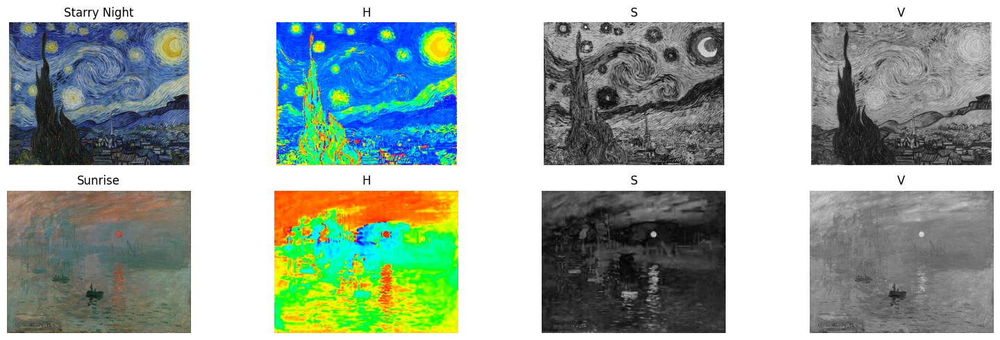

In [ ]:
# HSV 채널로 각 분할된 영상
plt.figure(figsize=(16,5))

# Starry Night
plt.subplot(2,4,1)
plt.imshow(img_sn_rgb)
plt.title("Starry Night")
plt.axis('off')
plt.subplot(2,4,2)
plt.imshow(H_sn, cmap='hsv')
plt.title("H")
plt.axis('off')
plt.subplot(2,4,3)
plt.imshow(S_sn, cmap='gray')
plt.title("S")
plt.axis('off')
plt.subplot(2,4,4)
plt.imshow(V_sn, cmap='gray')
plt.title("V")
plt.axis('off')

# Sunrise
plt.subplot(2,4,5)
plt.imshow(img_sr_rgb)
plt.title("Sunrise")
plt.axis('off')
plt.subplot(2,4,6)
plt.imshow(H_sr, cmap='hsv')
plt.title("H")
plt.axis('off')
plt.subplot(2,4,7)
plt.imshow(S_sr, cmap='gray')
plt.title("S")
plt.axis('off')
plt.subplot(2,4,8)
plt.imshow(V_sr, cmap='gray')
plt.title("V")
plt.axis('off')

plt.tight_layout()
plt.show()

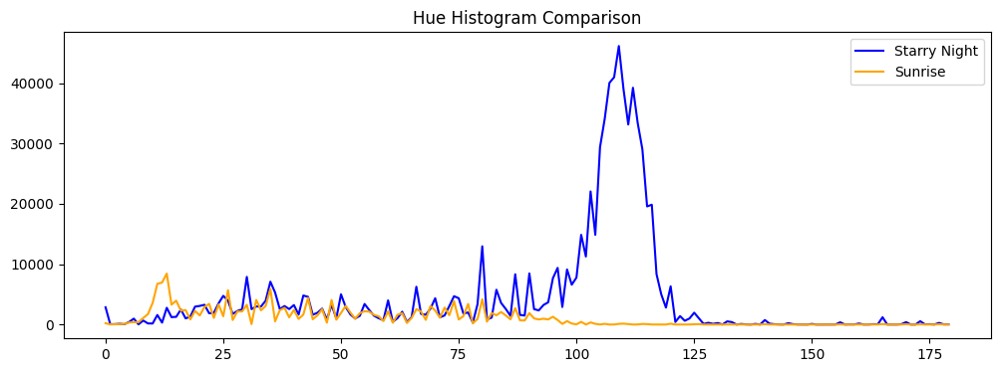

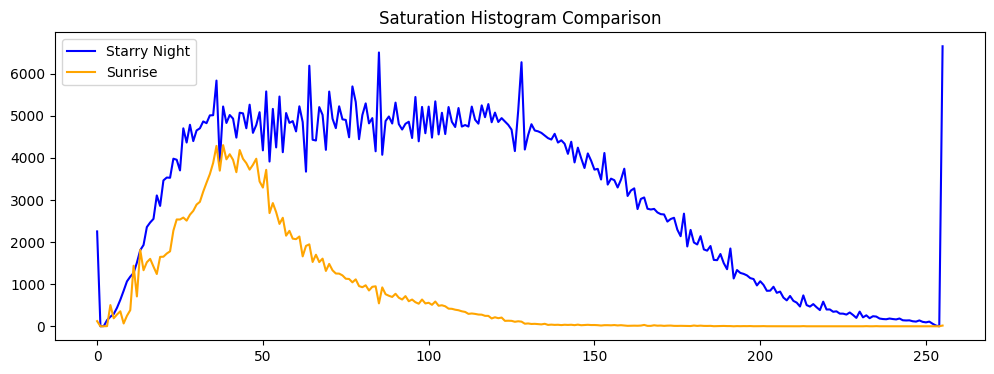

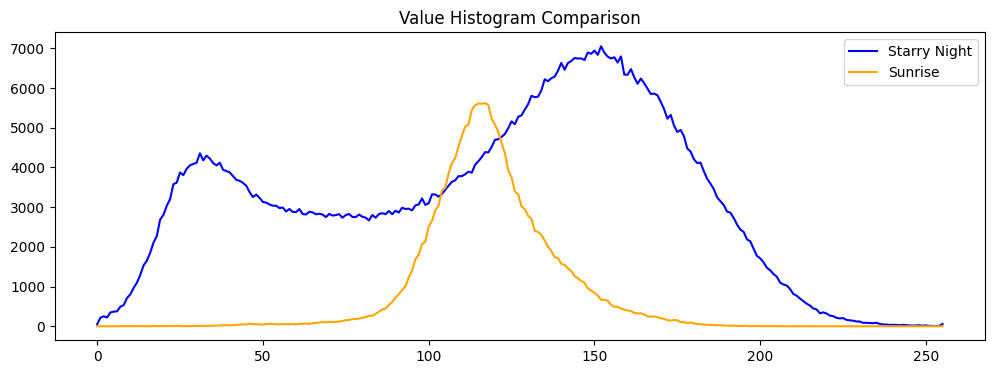

In [ ]:
# 히스토그램 계산 및 시각화 (HSV)
hist_H_sn = cv2.calcHist([H_sn],[0],None,[180],[0,180])
hist_H_sr = cv2.calcHist([H_sr],[0],None,[180],[0,180])

hist_S_sn = cv2.calcHist([S_sn],[0],None,[256],[0,256])
hist_S_sr = cv2.calcHist([S_sr],[0],None,[256],[0,256])

hist_V_sn = cv2.calcHist([V_sn],[0],None,[256],[0,256])
hist_V_sr = cv2.calcHist([V_sr],[0],None,[256],[0,256])

plt.figure(figsize=(12,4))
plt.plot(hist_H_sn, color='blue', label='Starry Night')
plt.plot(hist_H_sr, color='orange', label='Sunrise')
plt.title("Hue Histogram Comparison")
plt.legend()
plt.show()

plt.figure(figsize=(12,4))
plt.plot(hist_S_sn, color='blue', label='Starry Night')
plt.plot(hist_S_sr, color='orange', label='Sunrise')
plt.title("Saturation Histogram Comparison")
plt.legend()
plt.show()

plt.figure(figsize=(12,4))
plt.plot(hist_V_sn, color='blue', label='Starry Night')
plt.plot(hist_V_sr, color='orange', label='Sunrise')
plt.title("Value Histogram Comparison")
plt.legend()
plt.show()

In [ ]:
# 평균(대표 색상) / 표준편차(색 분포)계산
print("별이 빛나는 밤의 평균 / 표준편차")
print("Hue:", np.mean(H_sn), np.std(H_sn))
print("Saturation:", np.mean(S_sn), np.std(S_sn))
print("Value:", np.mean(V_sn), np.std(V_sn))
print()
print("인상, 해돋이의 평균 / 표준편차")
print("Hue:", np.mean(H_sr), np.std(H_sr))
print("Saturation:", np.mean(S_sr), np.std(S_sr))
print("Value:", np.mean(V_sr), np.std(V_sr))

별이 빛나는 밤의 평균 / 표준편차
Hue: 91.95432996207333 30.018681439399558
Saturation: 99.81740581542351 53.049193823333496
Value: 116.88183059418458 53.37775554423113

인상, 해돋이의 평균 / 표준편차
Hue: 44.88861855670103 27.059158297743412
Saturation: 50.09410824742268 25.62364352615164
Value: 118.67134536082474 18.51984896579282


별이 빛나는 밤 대표 색 RGB 3개:
[[ 50  38  31]
 [156 158 142]
 [132  94  71]]


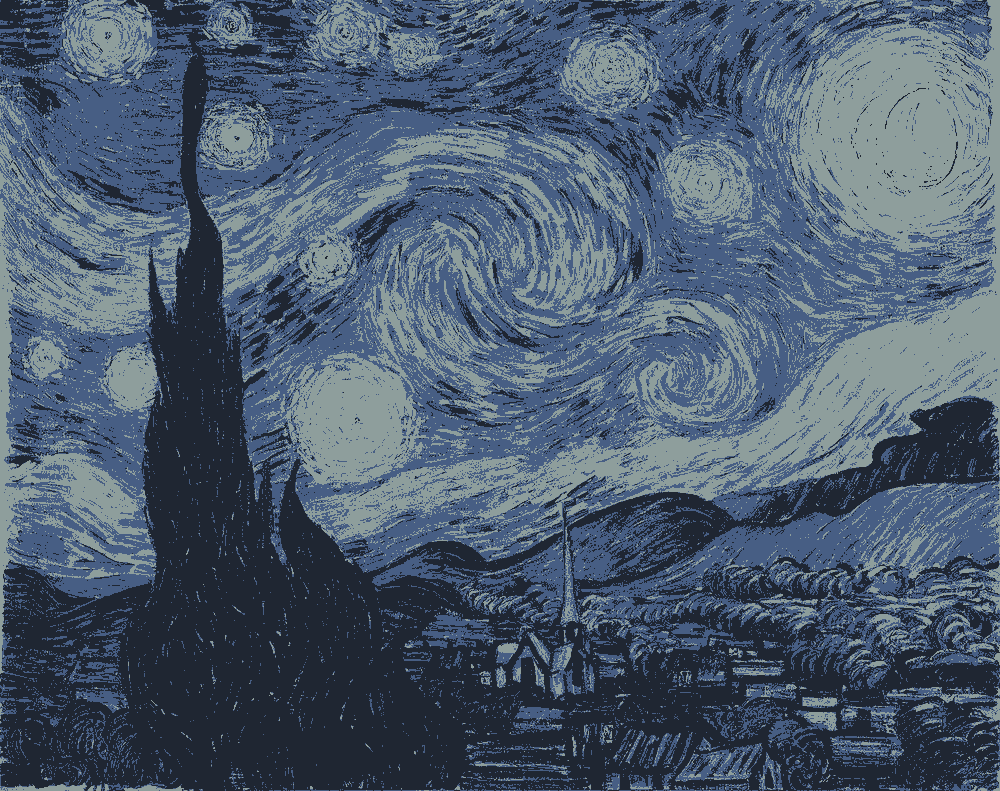

인상,해돋이 대표 색 RGB 3개:
[[106 123 138]
 [101 113 107]
 [ 80  93  81]]


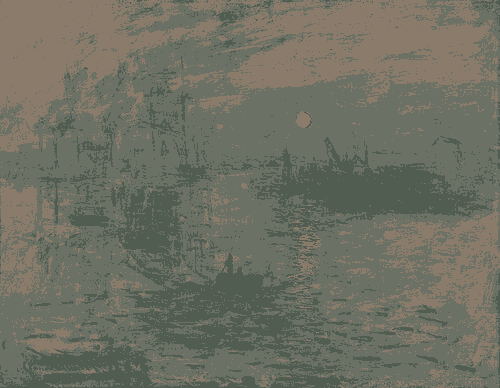

In [ ]:
# K-means 대표 색상 추출

# 별이 빛나는 밤 K-means 대표 색상
Z_sn = img_sn.reshape((-1,3)).astype(np.float32)

K = 3
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
ret_sn, label_sn, center_sn = cv2.kmeans(Z_sn, K, None, criteria, 5, cv2.KMEANS_RANDOM_CENTERS)
center_sn = np.uint8(center_sn)
print("별이 빛나는 밤 대표 색 RGB 3개:")
print(center_sn)

res_sn = center_sn[label_sn.flatten()]
res_img_sn = res_sn.reshape((img_sn.shape))
cv2_imshow(res_img_sn)

# 인상, 해돋이 K-means 대표 색상
Z_sr = img_sr.reshape((-1,3)).astype(np.float32)
ret_sr, label_sr, center_sr = cv2.kmeans(Z_sr, K, None, criteria, 5, cv2.KMEANS_RANDOM_CENTERS)
center_sr = np.uint8(center_sr)
print("인상,해돋이 대표 색 RGB 3개:")
print(center_sr)

res_sr = center_sr[label_sr.flatten()]
res_img_sr = res_sr.reshape((img_sr.shape))
cv2_imshow(res_img_sr)

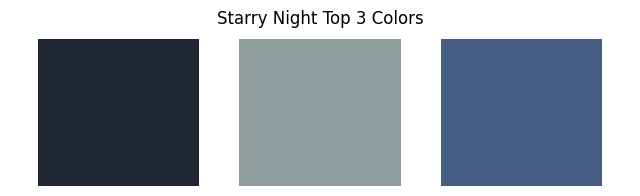

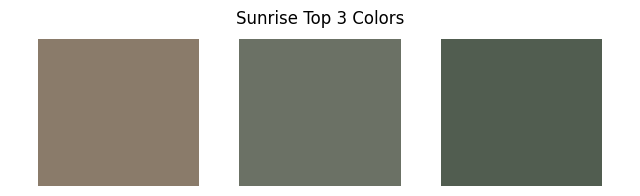

In [ ]:
# BGR → RGB 변환
center_sn_rgb = center_sn[:, ::-1]
center_sr_rgb = center_sr[:, ::-1]

# 별이 빛나는 밤: 대표 색상 시각화
plt.figure(figsize=(8,2))
for i, c in enumerate(center_sn_rgb):
    plt.bar(i, 1, color=c/255)
plt.title("Starry Night Top 3 Colors")
plt.axis('off')
plt.show()

# 인상, 해돋이: 대표 색상 시각화
plt.figure(figsize=(8,2))
for i, c in enumerate(center_sr_rgb):
    plt.bar(i, 1, color=c/255)
plt.title("Sunrise Top 3 Colors")
plt.axis('off')
plt.show()


붓질 방향과 패턴 분석

In [ ]:
# 이미지 불러오기, 그레이 변환
img_sn_tex = cv2.imread('/content/gdrive/My Drive/IP/Images/starry_night.jpg')
g_sn_tex = cv2.cvtColor(img_sn_tex, cv2.COLOR_BGR2GRAY)

img_sr_tex = cv2.imread('/content/gdrive/My Drive/IP/Images/sunrise.jpg')
g_sr_tex = cv2.cvtColor(img_sr_tex, cv2.COLOR_BGR2GRAY)

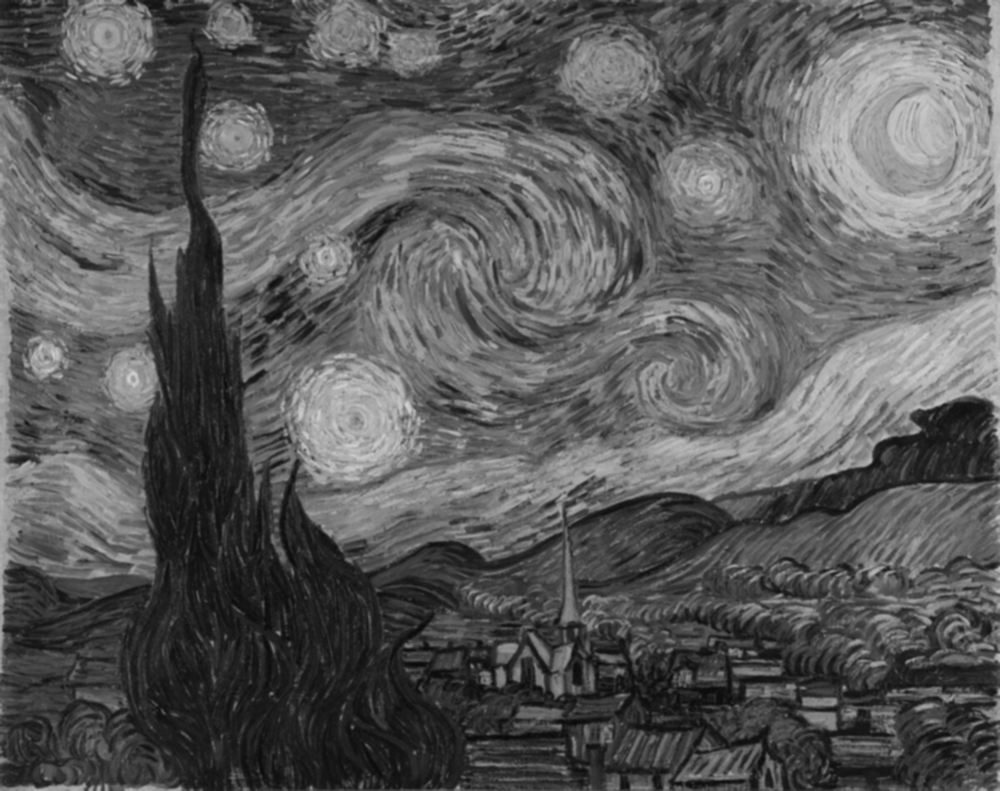

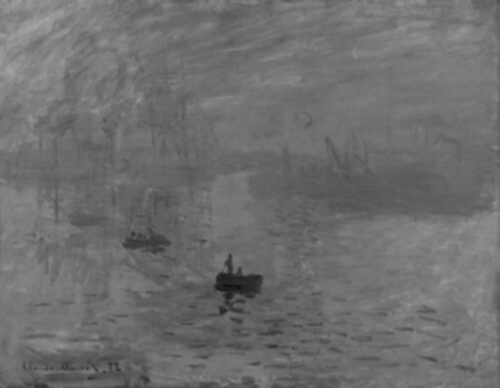

In [ ]:
# 가우시안 블러 (노이즈 제거)
g_sn_blur_tex = cv2.GaussianBlur(g_sn_tex, (5,5), 0)
cv2_imshow(g_sn_blur_tex)

g_sr_blur_tex = cv2.GaussianBlur(g_sr_tex, (5,5), 0)
cv2_imshow(g_sr_blur_tex)

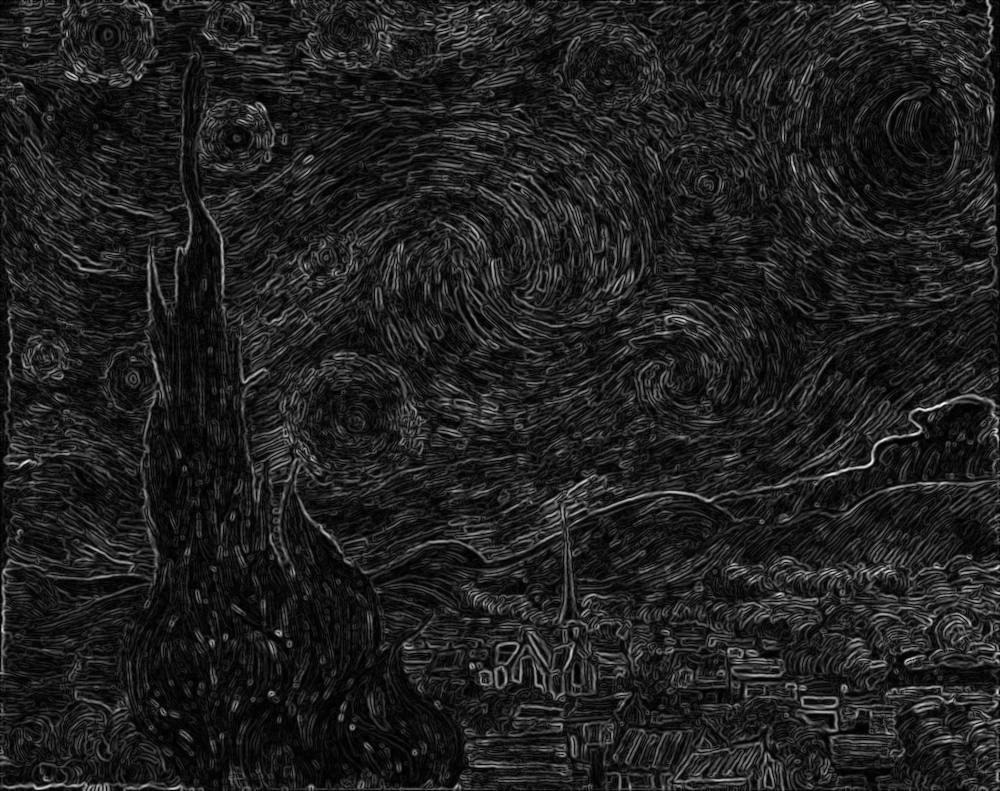

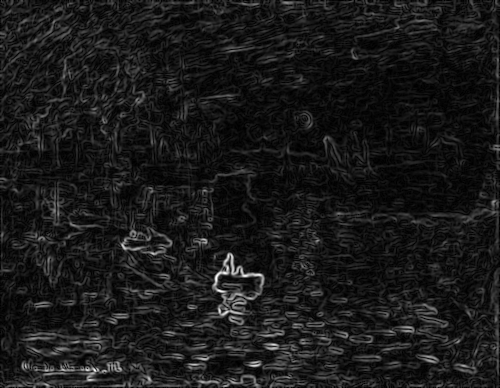

In [ ]:
# 소벨 에지 계산

# 별이 빛나는 밤
sobelx_sn_tex = cv2.Sobel(g_sn_blur_tex, cv2.CV_64F, 1, 0, ksize=3)
sobely_sn_tex = cv2.Sobel(g_sn_blur_tex, cv2.CV_64F, 0, 1, ksize=3)
mag_sn_tex = np.sqrt(sobelx_sn_tex**2 + sobely_sn_tex**2)
mag_sn_u8_tex = np.uint8(mag_sn_tex / mag_sn_tex.max() * 255)
cv2_imshow(mag_sn_u8_tex)

# 해돋이
sobelx_sr_tex = cv2.Sobel(g_sr_blur_tex, cv2.CV_64F, 1, 0, ksize=3)
sobely_sr_tex = cv2.Sobel(g_sr_blur_tex, cv2.CV_64F, 0, 1, ksize=3)
mag_sr_tex = np.sqrt(sobelx_sr_tex**2 + sobely_sr_tex**2)
mag_sr_u8_tex = np.uint8(mag_sr_tex / mag_sr_tex.max() * 255)
cv2_imshow(mag_sr_u8_tex)

In [ ]:
# 에지 방향 계산 (붓터치 방향)
theta_sn_tex = np.arctan2(sobely_sn_tex, sobelx_sn_tex)
theta_sn_deg_tex = np.degrees(theta_sn_tex)
theta_sn_deg_tex[theta_sn_deg_tex < 0] += 360

theta_sr_tex = np.arctan2(sobely_sr_tex, sobelx_sr_tex)
theta_sr_deg_tex = np.degrees(theta_sr_tex)
theta_sr_deg_tex[theta_sr_deg_tex < 0] += 360

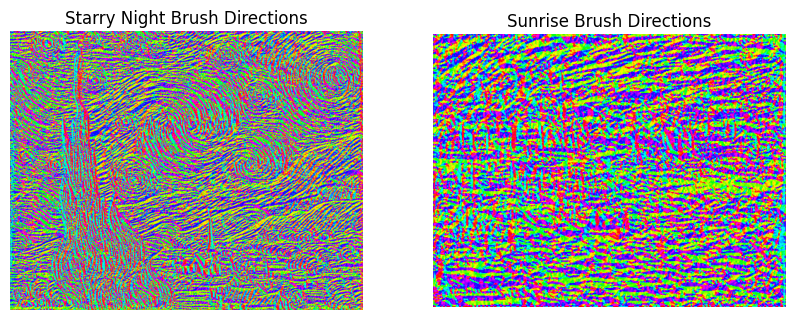

In [ ]:
# 에지 방향 시각화
plt.figure(figsize=(10,5))

# 별이 빛나는 밤
plt.subplot(1,2,1)
plt.imshow(theta_sn_deg_tex, cmap='hsv')
plt.title("Starry Night Brush Directions")
plt.axis('off')

# 인상, 해돋이
plt.subplot(1,2,2)
plt.imshow(theta_sr_deg_tex, cmap='hsv')
plt.title("Sunrise Brush Directions")
plt.axis('off')

plt.show()

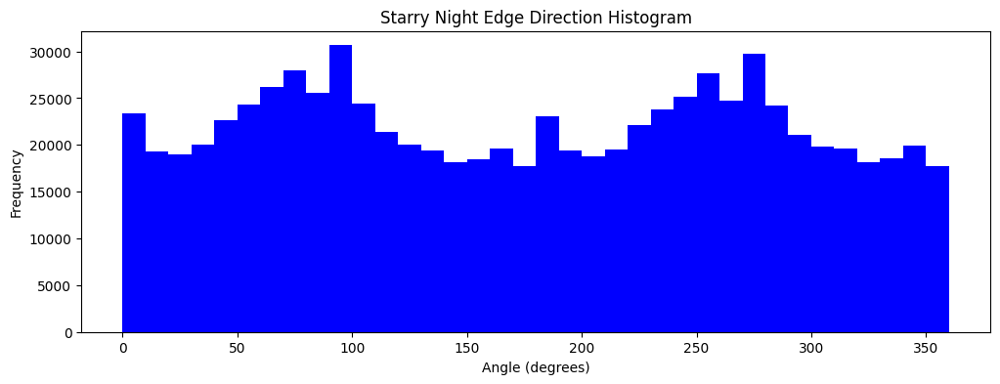

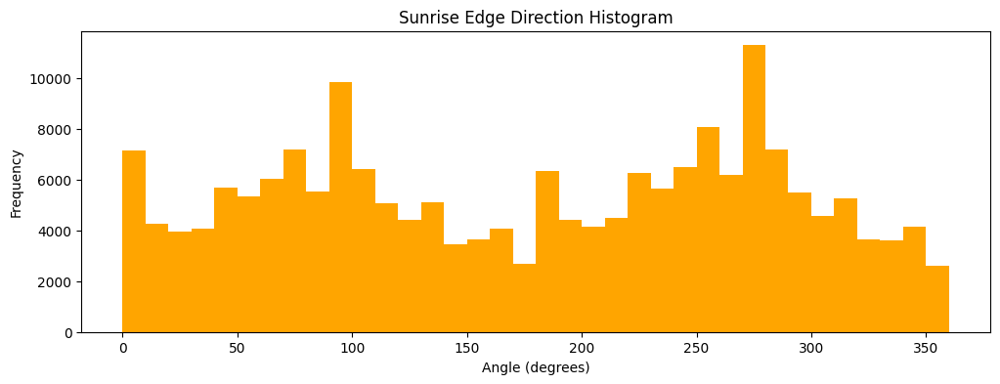

In [ ]:
# 에지 방향 히스토그램
plt.figure(figsize=(12,4))
plt.hist(theta_sn_deg_tex.flatten(), bins=36, range=(0,360), color='blue')
plt.title("Starry Night Edge Direction Histogram")
plt.xlabel("Angle (degrees)")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(12,4))
plt.hist(theta_sr_deg_tex.flatten(), bins=36, range=(0,360), color='orange')
plt.title("Sunrise Edge Direction Histogram")
plt.xlabel("Angle (degrees)")
plt.ylabel("Frequency")
plt.show()


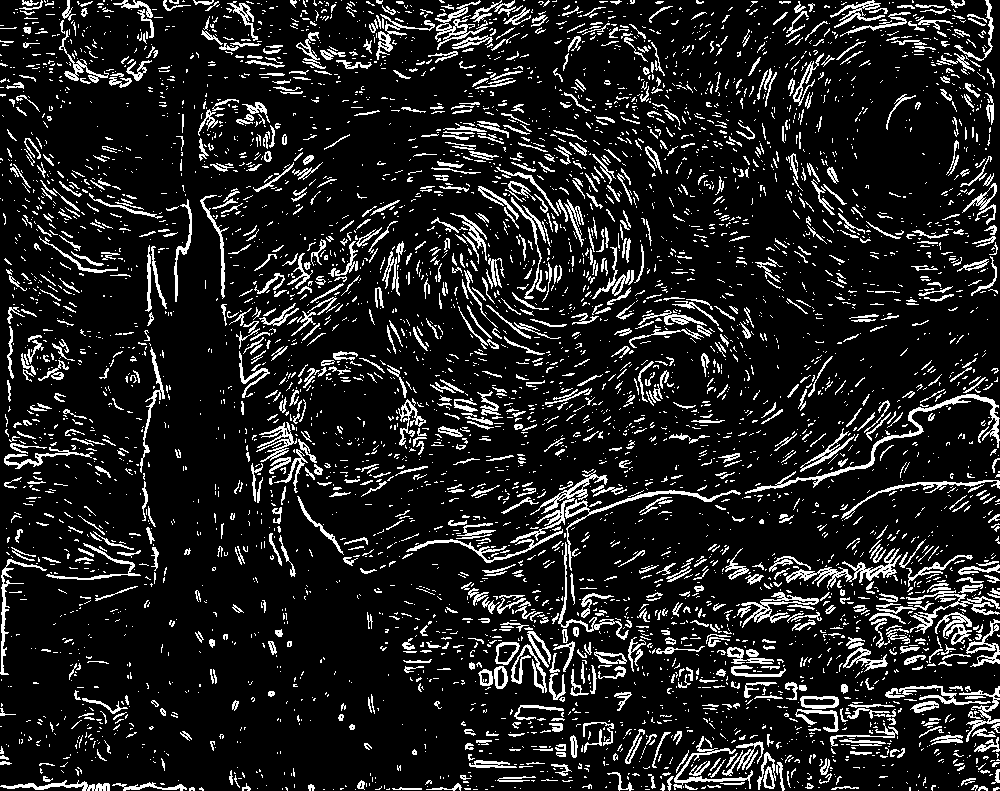

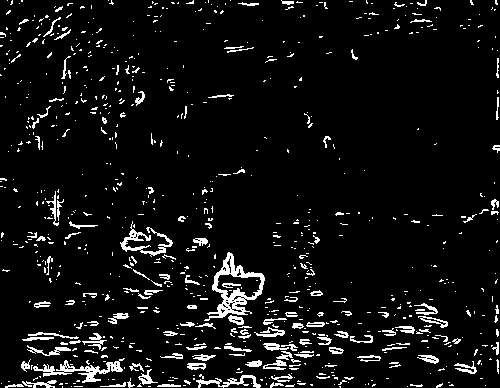

In [ ]:
# 에지 강조하기 (임계값 이진화)
Th_tex = 60

edge_sn_tex = np.zeros_like(mag_sn_u8_tex)
edge_sn_tex[mag_sn_u8_tex > Th_tex] = 255
cv2_imshow(edge_sn_tex)

edge_sr_tex = np.zeros_like(mag_sr_u8_tex)
edge_sr_tex[mag_sr_u8_tex > Th_tex] = 255
cv2_imshow(edge_sr_tex)

In [ ]:
# 에지 밀도 계산 (픽셀 대비 / 에지 비율)
total_sn_tex = g_sn_tex.size
edge_density_sn_tex = np.count_nonzero(edge_sn_tex) / total_sn_tex
print("별이 빛나는 밤 에지 비율:", edge_density_sn_tex)

total_sr_tex = g_sr_tex.size
edge_density_sr_tex = np.count_nonzero(edge_sr_tex) / total_sr_tex
print("인상, 해돋이 에지 비율:", edge_density_sr_tex)

별이 빛나는 밤 에지 비율: 0.1282591656131479
인상, 해돋이 에지 비율: 0.0649020618556701
